---
title: CIS 432 Homework 5
format:
  html:
    toc: true
    toc-location: left
    theme:
      light: flatly
      dark: darkly
    self-contained: true
editor: visual
jupyter: python3
---


# Simon Business School {style="text-align: center;"}

---------

###### CIS432 [33B] {style="text-align: center;"}

###### PREDICTIVE ANALYTICS USING PYTHON {style="text-align: center;"}

###### Prof Yaron Shaposhnik {style="text-align: center;"}

###### Spring B {style="text-align: center;"}

###### Homework 5 {style="text-align: center;"}

| Name| Email-Id| Student No.|
|:-----|:-----|:-----|
| Neeraja Menon | nmenon2_simon@simon.rochester.edu| 31318631 |
| Neha Jayachandran | njayacha@simon.rochester.edu | 32275841 |
| Saptarishi Pandey | spandey3@simon.rochester.edu | 32371505 |

--------


# Introduction

In this assignment, we will develop a predictive model decision support system that evaluates the risk of Home Equity Line Of Credit applications (HELOC).

Based on this predictive model, we intend to design an interactive interface that sales representatives in a bank/credit card company can use to decide on whether to accept or reject an application.

-------------

# About the dataset

To familiarize ourselves with the use case and the nuances of the dataset, we further researched on the dataset provided to us. Based on the [FICO website](https://community.fico.com/s/explainable-machine-learning-challenge), we found that credit scores are important to consider when financial institutions evaluate the risk on loans. The scores are designed to predict the likelihood of loan repayment. When a loan is rejected, regulators require the institution to inform the customers why their loan application is rejected in the first place. Customers demand explanations for their scores. If models are not interpretable, they are unlikely to be deployed in the real world as they do not meet the regulatory standards. Thus, one of our goals with our predictive model is to make it interpretable so the sales representative using the interface can give a reasonable explanation as to why the customer's loan application is rejected.

### HELOC

The HELOC allows property owners to take loans using the equity in their property as collateral. When a customer applies for a HELOC, the financial institution appraises their property and subtracts any mortgages. The remainder is the home equity which becomes the maximum amount that can be borrowed (credit limit). Because a home is often a consumer's most valuable asset, many homeowners use HELOCs only for major items such as home improvement, medical bills, or education, unlike a credit card that is generally used for day-to-day expenses.

The customers in this dataset have requested a credit line in the range of \$5000 through \$150,000. The objective of the model is to predict whether the customers will repay their HELOC account within 2 years. This prediction is then used to decide whether the homeowner qualifies for a HELOC, and if so, how much the credit should be extended.

The target variable to predict is a binary called `RiskPerformance`. Bad `RiskPerformance` means that the consumer was 90 days pas t due or worse at least once over a period of 20 months when the creid account was opened. Good `RiskPerformance` means that they have made their payments without ever being more than 90 days overdue.

| Variable | Explanation |
|:---------|:------------|
| `RiskPerformance`| Binary target |
| `ExternalRiskEstimate` | Consolidated indicator of risk markers |
| `MSinceOldestTradeOpen` | Number of months that have elapsed since the first trade |
| `MSinceMostRecentTradeOpen` | Number of months that have elapsed since the last opened trade |
| `AverageMInFile` | Average months in file |
| `NumSatisfactoryTrades` | Number of satisfactory trades |
| `NumTrades60Ever2DerogPubRec` | Number of trades which are more than 60 days past due |
| `NumTrades90Ever2DerogPubRec` | Number of trades which are more than 90 days past due |
| `PercentTradesNeverDelq` | Percent of trades, that were not delinquent |
| `MSinceMostRecentDelq1` | Number of months that have elapsed since last deliquent trade |
| `MaxDelq2PublicRecLast12M` | The longest delinquency period in the last 2 months |
| `MaxDelqEver` | The longest delinquency period |
| `NumTotalTrades` | Total number of trades |
| `NumTradesOpeninLast12M` | Number of trades opened in the last 12 months |
| `PercentInstallTrades` | Percent of installment trades |
| `MSinceMostRecentInqexcl7days` | Months since last inquiry (excluding the last 7 days) |
| `NumInqLast6M` | Number of inquiries in the last 6 months |
| `NumInqLast6Mexcl7days` | Number of inquiries in last 6 months (excluding the last 7 days) |
| `NetFractionRevolvingBurden` | Revolving balance divided by credit limit |
| `NetFractionInstallBurden` | Installment balance divided by original loan amount |
| `NumRevolvingTradesWBalance` | number of revolving trades with balance |
| `NumInstallTradesWBalance` | number of installment trades with balance |
| `NumBank2NatlTradesWHighUtilization` | number of trades with high utilization ratio (the amount of a credit card balance compared to the credit limit) |
| `PercentTradesWBalance` | percent of trades with balance |

------------

In [ ]:
#| echo: false
#| warning: false
#| message: false
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pickle
import re
import seaborn as sns
!pip3 install graphviz
import graphviz

import sklearn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import FunctionTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.impute import MissingIndicator
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.pipeline import FeatureUnion
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import BernoulliNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.linear_model import SGDClassifier
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn import svm
import xgboost as xgb

from sklearn.model_selection import GridSearchCV
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


-----------------------------

# Data exploration

In [ ]:
#| echo: false
#| warning: false
#| message: false
#| output: false

data = pd.read_csv("/content/drive/MyDrive/Predictive using python team project/heloc_dataset_v1.csv")
data.head(5)

,RiskPerformance,ExternalRiskEstimate,MSinceOldestTradeOpen,MSinceMostRecentTradeOpen,AverageMInFile,NumSatisfactoryTrades,NumTrades60Ever2DerogPubRec,NumTrades90Ever2DerogPubRec,PercentTradesNeverDelq,MSinceMostRecentDelq,...,PercentInstallTrades,MSinceMostRecentInqexcl7days,NumInqLast6M,NumInqLast6Mexcl7days,NetFractionRevolvingBurden,NetFractionInstallBurden,NumRevolvingTradesWBalance,NumInstallTradesWBalance,NumBank2NatlTradesWHighUtilization,PercentTradesWBalance
0,Bad,55,144,4,84,20,3,0,83,2,...,43,0,0,0,33,-8,8,1,1,69
1,Bad,61,58,15,41,2,4,4,100,-7,...,67,0,0,0,0,-8,0,-8,-8,0
2,Bad,67,66,5,24,9,0,0,100,-7,...,44,0,4,4,53,66,4,2,1,86
3,Bad,66,169,1,73,28,1,1,93,76,...,57,0,5,4,72,83,6,4,3,91
4,Bad,81,333,27,132,12,0,0,100,-7,...,25,0,1,1,51,89,3,1,0,80


In [ ]:
#| echo: false
#| warning: false
#| message: false
#| output: false

data.describe()

,ExternalRiskEstimate,MSinceOldestTradeOpen,MSinceMostRecentTradeOpen,AverageMInFile,NumSatisfactoryTrades,NumTrades60Ever2DerogPubRec,NumTrades90Ever2DerogPubRec,PercentTradesNeverDelq,MSinceMostRecentDelq,MaxDelq2PublicRecLast12M,...,PercentInstallTrades,MSinceMostRecentInqexcl7days,NumInqLast6M,NumInqLast6Mexcl7days,NetFractionRevolvingBurden,NetFractionInstallBurden,NumRevolvingTradesWBalance,NumInstallTradesWBalance,NumBank2NatlTradesWHighUtilization,PercentTradesWBalance
count,10459.000000,10459.000000,10459.000000,10459.000000,10459.000000,10459.000000,10459.000000,10459.000000,10459.000000,10459.000000,...,10459.000000,10459.000000,10459.000000,10459.000000,10459.000000,10459.000000,10459.000000,10459.000000,10459.000000,10459.000000
mean,67.425758,184.205373,8.543455,73.843293,19.428052,0.042738,-0.142843,86.661536,6.762406,4.928291,...,32.166460,-0.325366,0.868152,0.812602,31.629888,39.158906,3.185008,0.976097,0.018071,62.079166
std,21.121621,109.683816,13.301745,38.782803,13.004327,2.513910,2.367397,25.999584,20.501250,3.756275,...,20.128634,6.067556,3.179304,3.143698,30.060140,42.101601,4.413173,4.060995,3.358135,27.711565
min,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,...,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000
25%,63.000000,118.000000,3.000000,52.000000,12.000000,0.000000,0.000000,87.000000,-7.000000,4.000000,...,20.000000,-7.000000,0.000000,0.000000,5.000000,-8.000000,2.000000,1.000000,0.000000,47.000000
50%,71.000000,178.000000,5.000000,74.000000,19.000000,0.000000,0.000000,96.000000,-7.000000,6.000000,...,31.000000,0.000000,1.000000,1.000000,25.000000,47.000000,3.000000,2.000000,0.000000,67.000000
75%,79.000000,249.500000,11.000000,95.000000,27.000000,1.000000,0.000000,100.000000,14.000000,7.000000,...,44.000000,1.000000,2.000000,2.000000,54.000000,79.000000,5.000000,3.000000,1.000000,82.000000
max,94.000000,803.000000,383.000000,383.000000,79.000000,19.000000,19.000000,100.000000,83.000000,9.000000,...,100.000000,24.000000,66.000000,66.000000,232.000000,471.000000,32.000000,23.000000,18.000000,100.000000


In [ ]:
#| echo: false
#| warning: false
#| message: false
#| output: false
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10459 entries, 0 to 10458
Data columns (total 24 columns):
 #   Column                              Non-Null Count  Dtype 
---  ------                              --------------  ----- 
 0   RiskPerformance                     10459 non-null  object
 1   ExternalRiskEstimate                10459 non-null  int64 
 2   MSinceOldestTradeOpen               10459 non-null  int64 
 3   MSinceMostRecentTradeOpen           10459 non-null  int64 
 4   AverageMInFile                      10459 non-null  int64 
 5   NumSatisfactoryTrades               10459 non-null  int64 
 6   NumTrades60Ever2DerogPubRec         10459 non-null  int64 
 7   NumTrades90Ever2DerogPubRec         10459 non-null  int64 
 8   PercentTradesNeverDelq              10459 non-null  int64 
 9   MSinceMostRecentDelq                10459 non-null  int64 
 10  MaxDelq2PublicRecLast12M            10459 non-null  int64 
 11  MaxDelqEver                         10459 non-null  in

Upon observing the data, we could notice some interesting trends in the data. Clearly there are special encodings for certain values. Many features have encodings like -7. -8, or -9 in them.

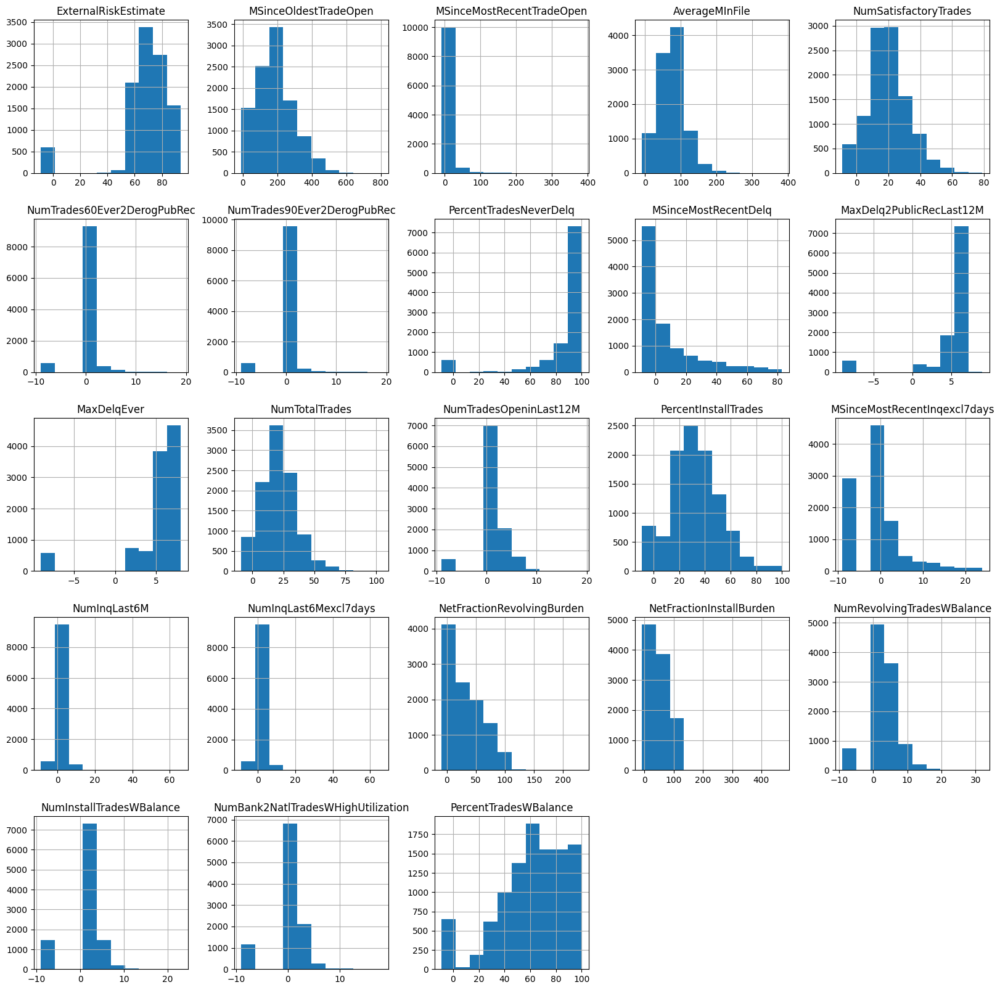

In [ ]:
#| echo: false
#| warning: false
#| message: false

data.hist(figsize = (20, 20));

In [ ]:
#| echo: false
#| warning: false
#| message: false
#| output: false

X = data.iloc[:, 1:]
y = data.iloc[:, 0]

In [ ]:
#| echo: false
#| warning: false
#| message: false
#| output: false

def convert_to_binary(x):
  return(x == "Bad").astype(int)

In [ ]:
#| echo: false
#| warning: false
#| message: false
#| output: false

y = convert_to_binary(y)

Let's create the training and testing sets

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size = 0.2,
                                                    random_state = 1234)

-------------

# Preprocessing


### Special Values

Since this case is clearly the same as the case we had in Assignment 2 (there are special encodings for missing data). We created special pipelines to deal with them.

From the data dictionary, we know that

| Value | Explanation |
|:-----:|:-----------:|
|-9| No Bureau record or investigation |
|-8| No usable/valid trades or enquiries |
|-7| Condition not met (no inquiries/no delinquencies) |

We could see that when the value is -9, it meant that there was no record or no investigation. We thus designed our model to not predict values for -9.

In [ ]:
#| echo: false
#| warning: false
#| message: false
#| output: false
#| echo: false
#| fig-cap: "Special values in the training set"

data_missings = pd.concat([(X_train == -7).sum(),
                           (X_train == -8).sum(),
                           (X_train == -9).sum()],
                          axis = 1)
data_missings.columns = [-7, -8, -9]
data_missings

,-7,-8,-9
ExternalRiskEstimate,0,0,460
MSinceOldestTradeOpen,0,201,451
MSinceMostRecentTradeOpen,0,0,451
AverageMInFile,0,0,451
NumSatisfactoryTrades,0,0,451
NumTrades60Ever2DerogPubRec,0,0,451
NumTrades90Ever2DerogPubRec,0,0,451
PercentTradesNeverDelq,0,0,451
MSinceMostRecentDelq,3746,137,451
MaxDelq2PublicRecLast12M,0,0,451


The pairplot below has more details about each feature with another.

In [ ]:
#| echo: false
#| warning: false
#| message: false
#| output: false

## Combining the two training sets to filter out values with -9 from the training data
train_data = pd.concat([y_train, X_train],
                       axis = 1)
train_data = train_data.drop(train_data[(train_data == -9).any(axis=1)].index)

## Resplitting the X_train and y_train
X_train = train_data.iloc[:, 1:]
y_train = train_data.iloc[:, 0]

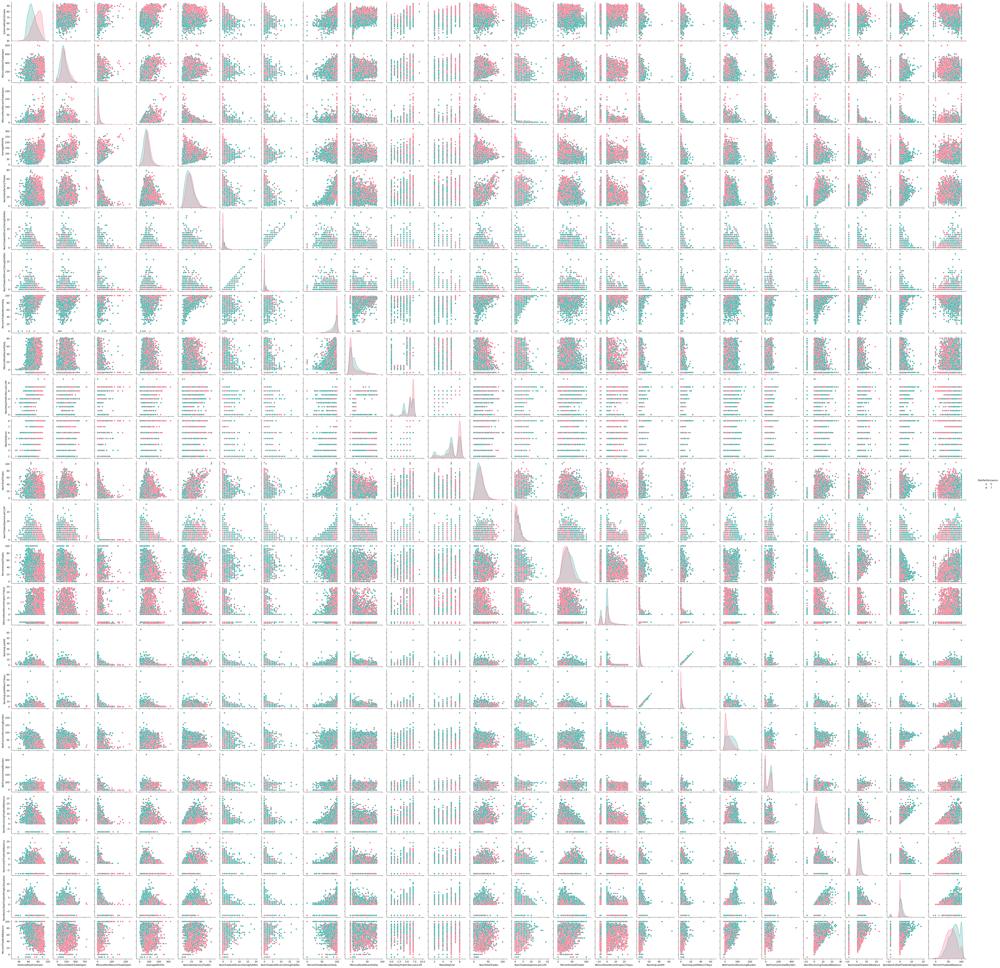

In [ ]:
#| echo: false
#| warning: false
#| message: false

var_names = [col for col in X_train.columns]
sns.pairplot(train_data, vars = var_names, hue = "RiskPerformance", palette = "husl")

### Special values in Maximum Delinquencies

We also noted that the columns related to max delinquencies are categorical variables and they have special meanings too.

:::::::::::::: {.columns}

::: {.column width="30%"}

`MaxDelq2PublicRecLast12M`

| Value | Explanation |
|:-----:|:-------:|
| 0 | Derogatory Comment |
| 1 | 120+ days delinquent |
| 2 | 90 days delinquent |
| 3 | 60 days delinquent |
| 4 | 30 days delinquent |
| 5, 6 | Unknown delinquency |
| 7 | Current and never delinquent |
| 8, 9 | All other |

:::

::: {.column width="30%"}

`MaxDelqEver`

| Value | Explanation |
|:-----:|:-----------:|
| 1 | No such value |
| 2 | Derogatory comment |
| 3 | 120+ days delinquent |
| 4 | 90 days delinquent |
| 5 | 60 days delinquent |
| 6 | 30 days delinquent |
| 7 | Unknown delinquency |
| 8 | Current and never delinquent |
| 9 | All other |

:::

::::::::::::::

To deal with these special values, along with the special values of -7 and -8, we created transformers.

Before we created the pipeline, we used techniques such as the Do nothing Imputer and the OneHot encoder to deal with informative missing values and categorical variable conversion to numerical representation respectively. We also dealt with the special encodings by adding dummy features for all -7 and -8 values. Once this was set, we proceeded with the model training.

### Creating pipelines

To preprocess the data, we needed to create pipelines. To this end, we dealt with special values using special encoding techniques, imputed mean values, and also dealt with categorical variables.

##### __Do nothing Imputer__

This works the same way as the do nothing imputer did in Assignment 3.

In [ ]:
#| echo: false
#| warning: false
#| message: false
#| output: false

## Do-nothing-imputer
do_nothing = ColumnTransformer(transformers = [],
                               remainder = "passthrough")


##### __OneHot encoder__

As discussed earlier, we now encoded the categorical features using `OneHotEncoder`.

In [ ]:
#| echo: false
#| warning: false
#| message: false
#| output: false

one_hot_cols = ["MaxDelq2PublicRecLast12M", "MaxDelqEver"]

ohe = OneHotEncoder(sparse_output = False,
                    handle_unknown = "ignore")

cat_transformer = ColumnTransformer(
   remainder = "passthrough",
   transformers = [("onehot", ohe, one_hot_cols)]
)

##### __Missing indicators__

As discussed earlier, we then dealt with the special encodings. We added dummy features for all -7 and -8 values.

In [ ]:
#| echo: false
#| warning: false
#| message: false
#| output: false

missing_7 = MissingIndicator(missing_values = -7,
                             features = "missing-only")

missing_8 = MissingIndicator(missing_values = -8,
                             features = "missing-only")

##### **Scaler**

We standard scaled the columns that require scaling (all the non OneHot columns) We did this with another `ColumnTransformer` object.

In [ ]:
#| echo: false
#| warning: false
#| message: false
#| output: false

cols_2_scale = ["ExternalRiskEstimate",
                "MSinceOldestTradeOpen",
                "MSinceMostRecentTradeOpen",
                "AverageMInFile",
                "NumSatisfactoryTrades",
                "NumTrades60Ever2DerogPubRec",
                "NumTrades90Ever2DerogPubRec",
                "PercentTradesNeverDelq",
                "MSinceMostRecentDelq",
                "NumTotalTrades",
                "NumTradesOpeninLast12M",
                "PercentInstallTrades",
                "MSinceMostRecentInqexcl7days",
                "NumInqLast6M",
                "NumInqLast6Mexcl7days",
                "NetFractionRevolvingBurden",
                "NetFractionInstallBurden",
                "NumRevolvingTradesWBalance",
                "NumInstallTradesWBalance",
                "NumBank2NatlTradesWHighUtilization",
                "PercentTradesWBalance"
                ]

In [ ]:
#| echo: false
#| warning: false
#| message: false
#| output: false
scaler = StandardScaler()
stdscaler = ColumnTransformer(
   remainder = "passthrough",
   transformers = [("stdscaler", scaler, cols_2_scale)]
)

##### __Pipelines__

We put all the column transformers and feature expansions into a pipeline for smooth preprocessing. We fit the pipeline to the training data and transformed it accordingly. Then we transformed the test data with this pipeline.

In [ ]:
#| echo: false
#| warning: false
#| message: false
#| output: false

feature_expansion = FeatureUnion([("", do_nothing),
                                  ("minus7", missing_7),
                                  ("minus8", missing_8)
                                  ])

pipe = Pipeline([
    ("cat transform", cat_transformer),
    ("expand features", feature_expansion),
    ("replace -7 with -8", SimpleImputer(missing_values=-7, strategy='constant', fill_value=-8)),
    ("replace -8 with mean", SimpleImputer(missing_values=-8, strategy='mean')),
    ])

In [ ]:
#| echo: false
#| warning: false
#| message: false
#| output: false

def removeTerms(text):
  text = re.sub(r"__remainder__remainder__", "", text)
  text = re.sub(r"__remainder__onehot__", "", text)
  text = re.sub(r"__missingindicator_remainder__", "", text)
  return(text)

X_train_t = pipe.fit_transform(X_train)

column_names = pd.Series(pipe[:-1].get_feature_names_out())
column_names = column_names.apply(lambda x:removeTerms(x))

X_train_t = pd.DataFrame(X_train_t,
                         columns = column_names)

## Scaling
X_train_t_sc = stdscaler.fit_transform(X_train_t)
X_train_t_sc = pd.DataFrame(X_train_t_sc,
                            columns = column_names)

In [ ]:
#| echo: false
#| warning: false
#| message: false
#| output: false
X_test_t = pd.DataFrame(pipe.transform(X_test),
                        columns = column_names)

## Scaling
X_test_t_sc = stdscaler.transform(X_test_t)

X_test_t_sc = pd.DataFrame(X_test_t_sc,
                           columns = column_names)

In [ ]:
#| echo: false
#| warning: false
#| message: false
#| output: false

train_data_t_sc = pd.concat([y_train, X_train_t_sc],
                       axis = 1)

After preprocessing the data, the following are the colum names we had.

In [ ]:
train_data_t_sc.columns

Index(['RiskPerformance', 'MaxDelq2PublicRecLast12M_0',
       'MaxDelq2PublicRecLast12M_1', 'MaxDelq2PublicRecLast12M_2',
       'MaxDelq2PublicRecLast12M_3', 'MaxDelq2PublicRecLast12M_4',
       'MaxDelq2PublicRecLast12M_5', 'MaxDelq2PublicRecLast12M_6',
       'MaxDelq2PublicRecLast12M_7', 'MaxDelq2PublicRecLast12M_9',
       'MaxDelqEver_2', 'MaxDelqEver_3', 'MaxDelqEver_4', 'MaxDelqEver_5',
       'MaxDelqEver_6', 'MaxDelqEver_7', 'MaxDelqEver_8',
       'ExternalRiskEstimate', 'MSinceOldestTradeOpen',
       'MSinceMostRecentTradeOpen', 'AverageMInFile', 'NumSatisfactoryTrades',
       'NumTrades60Ever2DerogPubRec', 'NumTrades90Ever2DerogPubRec',
       'PercentTradesNeverDelq', 'MSinceMostRecentDelq', 'NumTotalTrades',
       'NumTradesOpeninLast12M', 'PercentInstallTrades',
       'MSinceMostRecentInqexcl7days', 'NumInqLast6M', 'NumInqLast6Mexcl7days',
       'NetFractionRevolvingBurden', 'NetFractionInstallBurden',
       'NumRevolvingTradesWBalance', 'NumInstallTradesWBalance

-----------------
# Model training

Since interpretability is paramount for this specific case of credit risk, we focused on simpler, easier to explain models. Thus, we did not consider ensemble models (forests, bagging, boosting), although they may have higher accuracy.

The predictive model we chose is the Logistic Regression Classifier. Being a logistic  model, it is a straightforward and an interpretable model that estimates the probability of the target variable, RiskPerformance, taking a certain value, either “Good” or “Bad” based on the input features. This makes it easier to understand the relationship between the input features and RiskPerformance. In addition, the simplicity of the linear regression classifier allows us to train it relatively faster and easier compared to other complex models, while still achieving a reasonably good  predictive performance. In addition to that, logistic regression classifier models are effective for binary outcome predictions. Given that our target variable, RiskPerformance, is a binary variable, this model is a good choice to do the prediction.

Furthermore, in determining whether the logistic regression model was the better model to use, we ran other models to compare the performance metrics, such as accuracy. Our model’s accuracy was at 71.65%, which was significantly higher than other models’ accuracy rates. The Support Vector Machine (SVM) model had an accuracy rate of 50% while the Support Vector Classification (SVC) model had an accuracy rate of 57%.

### Choice of performance metric

We chose the metric True Positive Rate over Accuracy for this project.

We found that our __True Positive Rate (TPR)__, or Recall, was __78.18%__, which was the highest TPR that we were experiencing when compared to other models. In this case, the true positive rate is significant as it helps banks or credit companies identify whether their prediction model for loan default is capable of predicting whether consumers are likely to pay their loan. Having a high positive rate indicates that the model is effective in identifying individuals who are likely to default on a loan. If the TPR is higher, it means that the model is correctly able to capture a higher proportion of bad risk customers, which is very important in the case of credit risk.


### Logistic regression classifier

First we will try out the logistic regression classifier. We will work with linear models because of their interpretability.


In [ ]:
#| echo: false
#| warning: false
#| message: false
#| output: false
lr = LogisticRegression(solver = "liblinear")

param_grid = {"penalty": ["l1", "l2", "elasticnet"],
              "max_iter": list(range(100, 500, 50)),
              "C": [0.001, 0.01, 0.1, 1, 10, 100, 1000]}

lr_grid_search = GridSearchCV(lr, param_grid, cv = 5)

lr_grid_search.fit(X_train_t_sc, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
280 fits failed out of a total of 840.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
280 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 1162, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 64, in _check_solver
    raise ValueError(
ValueError: On

GridSearchCV(cv=5, estimator=LogisticRegression(solver='liblinear'),
             param_grid={'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
                         'max_iter': [100, 150, 200, 250, 300, 350, 400, 450],
                         'penalty': ['l1', 'l2', 'elasticnet']})

In [ ]:
#| echo: false
#| warning: false

lr_y_pred_proba = lr_grid_search.predict_proba(X_test_t_sc)
lr_y_pred = (lr_y_pred_proba[:, 1] >= 0.50).astype(int)

lr_accuracy = lr_grid_search.score(X_test_t_sc, y_test)

print("Accuracy of the logistic regression classifier: " + str(lr_accuracy))

Accuracy of the logistic regression classifier: 0.7165391969407265


<function matplotlib.pyplot.show(close=None, block=None)>

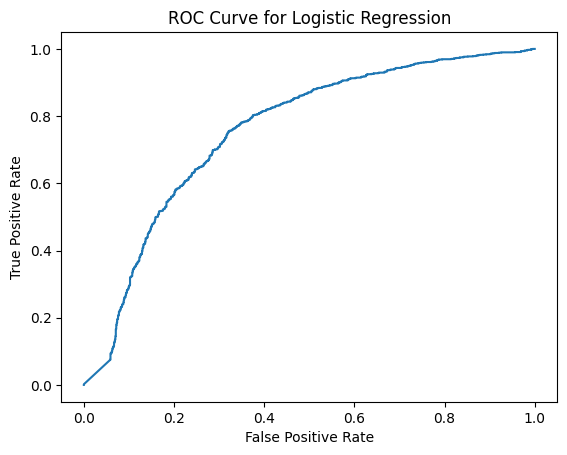

In [ ]:
#| echo: false
#| message: false
#| warning: false

fpr, tpr, thresholds = metrics.roc_curve(y_true = y_test,
                                         y_score = lr_y_pred_proba[:, 1],
                                         pos_label = 1)
plt.plot(fpr, tpr)
plt.ylabel("True Positive Rate")
plt.xlabel("False Positive Rate")
plt.title("ROC Curve for Logistic Regression")
plt.show

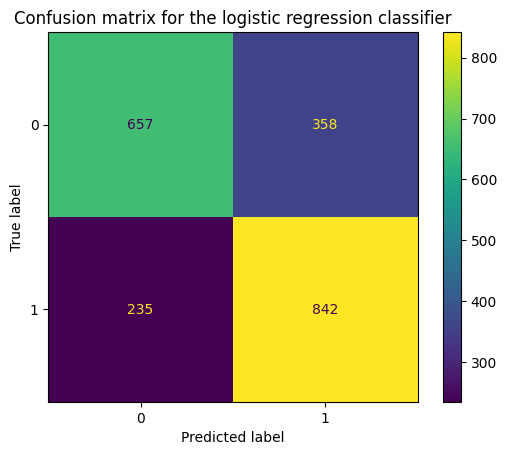

In [ ]:
#| echo: false
#| message: false

metrics.ConfusionMatrixDisplay(metrics.confusion_matrix(y_test, lr_y_pred)).plot()
plt.title("Confusion matrix for the logistic regression classifier")
plt.show()

In [ ]:
#| echo: false
#| warning: false
#| message: false
#| output: false

metrics.accuracy_score(y_true = y_test,
                       y_pred = lr_y_pred)

0.7165391969407265

Let us look at the coefficients of the regression

In [ ]:
#| echo: false
#| output: false

lr_grid_search_coef = {"coefficient" : X_test_t_sc.columns,
                       "value" : pd.Series(lr_grid_search.best_estimator_.coef_.ravel())}
lr_grid_search_coef = pd.DataFrame(data = lr_grid_search_coef)

,coefficient,value
0,MaxDelq2PublicRecLast12M_0,-0.495485
1,MaxDelq2PublicRecLast12M_1,0.000000
2,MaxDelq2PublicRecLast12M_2,0.003514
3,MaxDelq2PublicRecLast12M_3,-0.284470
4,MaxDelq2PublicRecLast12M_4,-0.351251
5,MaxDelq2PublicRecLast12M_5,0.028482
6,MaxDelq2PublicRecLast12M_6,0.000000
7,MaxDelq2PublicRecLast12M_7,-0.093551
8,MaxDelq2PublicRecLast12M_9,-0.077420
9,MaxDelqEver_2,-0.053514


<Axes: title={'center': 'Coefficient plot of Logistic Regression'}>

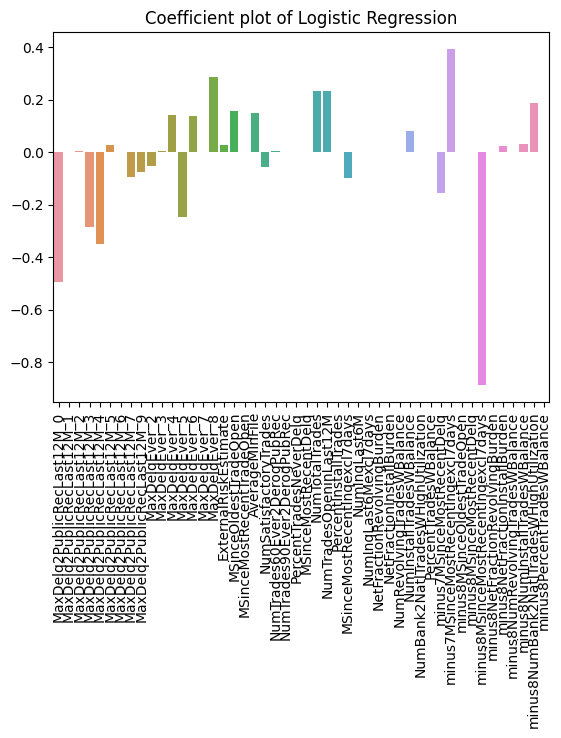

In [ ]:
#| echo: false
#| warning: false
#| message: false

lr_coef_plot = sns.barplot(data = lr_grid_search_coef, x = "coefficient", y = "value")
plt.setp(lr_coef_plot.get_xticklabels(), rotation = 90)
plt.title("Coefficient plot of Logistic Regression")
lr_coef_plot

Some of these coefficients are equal to 0, but there is something interesting about Months since last inquiry (excluding the last 7 days) categorical variables. Especially when the value is 8

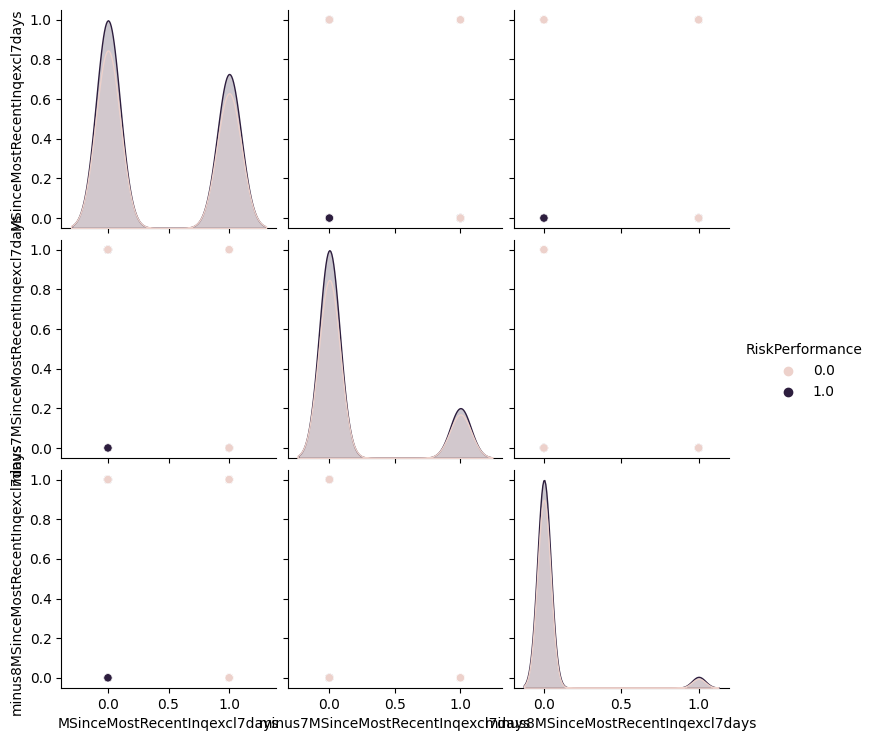

In [ ]:
sns.pairplot(data = train_data_t_sc.filter(regex = "MSinceMostRecentInqexcl7days|RiskPerformance"),
                 hue = "RiskPerformance")

Upon further investigation, it doesn't seem like this would help much when it comes to classificatino of risk performance, as there is not a significant difference between the distributions of risk performance and the various categories of this feature. Thus it will not help us much in the case of classification.

### SVM Classifier

In [ ]:
#| echo: false
#| warning: false
#| message: false
#| output: false

svmclf = svm.SVC(kernel = "rbf")

param_grid = {"max_iter": list(range(0, 500, 50)),
              "C": [0.001, 0.01, 0.1, 1, 10, 100, 1000]}

svmclf_grid_search = GridSearchCV(svmclf, param_grid, cv = 5)

svmclf_grid_search.fit(X_train_t_sc, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=0).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=0).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=0).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=0).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=0).  Consider pre-processing

GridSearchCV(cv=5, estimator=SVC(),
             param_grid={'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
                         'max_iter': [0, 50, 100, 150, 200, 250, 300, 350, 400,
                                      450]})

In [ ]:
#| echo: false
#| warning: false
#| message: false

svmclf_accuracy = svmclf_grid_search.score(X_test_t_sc, y_test)
print("Accuracy of the SVM classifier: " + str(svmclf_accuracy))

Accuracy of the SVM classifier: 0.5688336520076482


<function matplotlib.pyplot.show(close=None, block=None)>

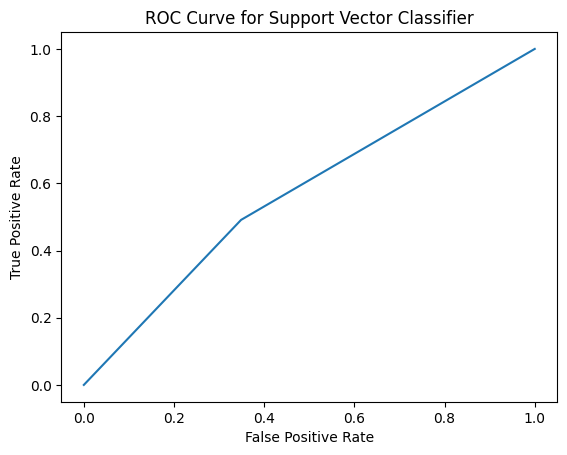

In [ ]:
#| echo: false
#| warning: false
#| message: false

fpr, tpr, thresholds = metrics.roc_curve(y_true = y_test,
                                         y_score = svmclf_grid_search.predict(X_test_t_sc),
                                         pos_label = 1)
plt.plot(fpr, tpr)
plt.ylabel("True Positive Rate")
plt.xlabel("False Positive Rate")
plt.title("ROC Curve for Support Vector Classifier")
plt.show

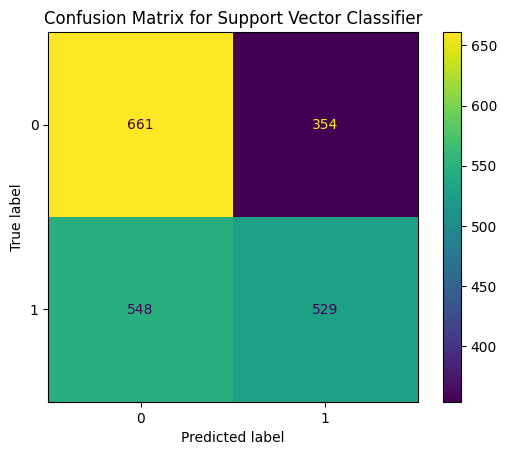

In [ ]:
#| echo: false
#| warning: false
#| message: false

metrics.ConfusionMatrixDisplay(metrics.confusion_matrix(y_test, svmclf_grid_search.predict(X_test_t_sc))).plot()
plt.title("Confusion Matrix for Support Vector Classifier")
plt.show()

---------

### Decision tree

In [ ]:
#| echo: false
#| warning: false
#| message: false
#| output: false

tree_classifier = DecisionTreeClassifier()

param_grid = [{'max_depth':range(1,13),
               'min_samples_leaf':[10,20,100],
               'max_leaf_nodes':[2,4,6,20,100,10000]}]

tree_grid = GridSearchCV(tree_classifier,
                           param_grid,
                           cv=5,
                           scoring='accuracy')

tree_grid.fit(X_train_t_sc, y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid=[{'max_depth': range(1, 13),
                          'max_leaf_nodes': [2, 4, 6, 20, 100, 10000],
                          'min_samples_leaf': [10, 20, 100]}],
             scoring='accuracy')

In [ ]:
#| echo: false
#| warning: false

tree_clf_accuracy = tree_grid.score(X_test_t_sc, y_test)
print("Accuracy of the Decision tree stump classifier: " + str(tree_clf_accuracy))

Accuracy of the Decision tree stump classifier: 0.6955066921606119


This tree stump performs worse than the other models we have seen so far, but we might have something to ensemble with.

<function matplotlib.pyplot.show(close=None, block=None)>

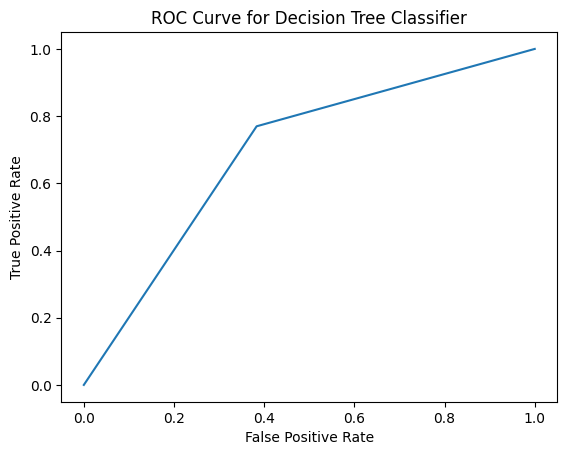

In [ ]:
#| echo: false
#| message: false
#| warning: false

fpr, tpr, thresholds = metrics.roc_curve(y_true = y_test,
                                         y_score = tree_grid.predict(X_test_t_sc),
                                         pos_label = 1)
plt.plot(fpr, tpr)
plt.ylabel("True Positive Rate")
plt.xlabel("False Positive Rate")
plt.title("ROC Curve for Decision Tree Classifier")
plt.show

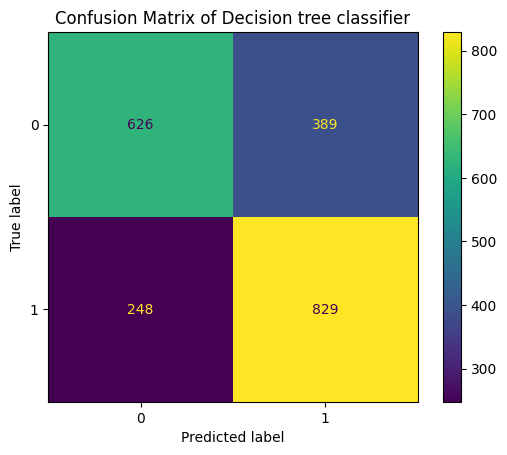

In [ ]:
#| echo: false
#| warning: false
#| message: false

metrics.ConfusionMatrixDisplay(metrics.confusion_matrix(y_test, tree_grid.predict(X_test_t_sc))).plot()
plt.title("Confusion Matrix of Decision tree classifier")
plt.show()

The recall performance of this model is relatively good considering that it is a single tree.

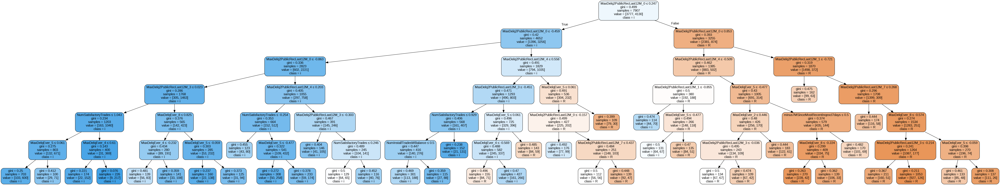

In [ ]:
#| echo: false
#| warning: false
#| message: false

best_tree = tree_grid.best_estimator_
dot_data = export_graphviz(best_tree, out_file=None,
                           feature_names= X_train_t_sc.columns,
                           class_names= "RiskPerformance",
                           filled=True, rounded=True,
                           special_characters=True)

# Display the decision tree
graph = graphviz.Source(dot_data)
graph = graphviz.Source(dot_data, format='png')

import pydot
from IPython.display import Image

# display the graph inline
Image(graph.render())

The only problem from this is interpretability. While this model performs rather well (high recall), we cannot choose it as it would not work well in real life. Thus, we will go with the relatively simpler but comparable model: logistic regression classifier.

-------

# Conclusion

We are considering the logistic regression classifier for this project, because of its easy interpretability and decent recall performance. The $\beta$ can be inspected in the code file of this report.

However, it has some limitations still, which we will discuss now.

### Limitations

While we were able to achieve a decent accuracy with our model, we realize that our model may have some limitations that may affect the prediction aspect of it. Logistic Regression Classifier  may have limited flexibility, i.e, it may not capture any complex relationships between the variables that could have an impact on whether a consumer will default on loan payment or not.

Furthermore, our accuracy could have been higher, in order to be a more effective model in predicting loan defaulters more accurately. Lastly, the model is not fully interpretable as desired due to the limitations it faces with dealing with complex relationships between the variables and assumptions such as the linearity aspect of it.

----



In [ ]:
#| echo: false
#| include: false
#| message: false
#| warning: false

print("Intercept: " +str(lr_grid_search.best_estimator_.intercept_))
print("\n Parameters: " + str(lr_grid_search.best_estimator_.coef_))

Intercept: [0.10003843]

 Parameters: [[-4.95484964e-01  0.00000000e+00  3.51415952e-03 -2.84470349e-01
  -3.51250897e-01  2.84817365e-02  0.00000000e+00 -9.35513464e-02
  -7.74195251e-02 -5.35139008e-02  3.21727896e-03  1.42163823e-01
  -2.47797007e-01  1.37123764e-01  0.00000000e+00  2.85221295e-01
   2.53917416e-02  1.57091077e-01  0.00000000e+00  1.50053338e-01
  -5.62831891e-02  4.96222184e-03  0.00000000e+00  0.00000000e+00
   0.00000000e+00  2.31247323e-01  2.30840472e-01  0.00000000e+00
  -9.83404810e-02  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  5.10258987e-04  7.97649912e-02  0.00000000e+00
   0.00000000e+00 -1.54173277e-01  3.93035013e-01  0.00000000e+00
   0.00000000e+00 -8.86361527e-01  0.00000000e+00  2.36039612e-02
   0.00000000e+00  3.19191096e-02  1.86837912e-01  0.00000000e+00]]


In [ ]:
#| echo: false
#| include: false
#| message: false
#| warning: false

## Exporting the model
!pip3 install streamlit
import streamlit as st

with open("model.p", "wb") as f:
  pickle.dump(lr_grid_search.best_estimator_, f)

with open('pipeline.p', 'wb') as f:
	pickle.dump(pipe, f)

with open('stdscaler.p', 'wb') as f:
	pickle.dump(stdscaler, f)



print('These are the predictions using the model that was loaded from the file')

print('Done!')


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.9/8.9 MB 49.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 164.8/164.8 kB 17.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 19.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.8/4.8 MB 52.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.1/82.1 kB 9.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 7.1 MB/s eta 0:00:00
  Created wheel for validators: filename=validators-0.20.0-py3-none-any.whl size=19579 sha256=b75640cef19b641a00d869b607663a4d279267dfffdfbaa1a4bdd708af0eb392
  Stored in directory: /root/.cache/pip/wheels/f2/ed/dd/d3a556ad245ef9dc570c6bcd2f22886d17b0b408dd3bbb9ac3
Successfully built validators
These are the predictions using the model that was loaded from the file
Done!


In [ ]:
lr_grid_search.best_estimator_

LogisticRegression(C=0.1, penalty='l1', solver='liblinear')